In [1]:
import sys
sys.path.append('../')
import datetime as dt
from datetime import date, timedelta
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import importlib
import pickle
import json
import dataloader as loader
from pathlib import Path
from collections import deque
importlib.reload(loader)

<module 'dataloader' from '..\\dataloader.py'>

In [2]:
MAIN_DIR = Path('../')
GEOLOCATION_DIR = MAIN_DIR / 'upstream' / 'data' / 'us' / 'geolocation'

In [3]:
neighbor_df = pd.read_csv(GEOLOCATION_DIR / 
    'neighborcounties.csv', dtype={'orgfips':str, 'adjfips': str})


In [174]:
neighbor_df[neighbor_df['orgfips'] == '34021']

,orgfips,adjfips,instate
10109,34021,34005,1
10110,34021,34019,1
10111,34021,34023,1
10112,34021,34025,1
10113,34021,34035,1
10114,34021,42017,0


In [176]:
adjacency_list['42017']

['42101', '42091', '42077', '42095']

In [2]:
info = loader.load_info_raw(fips_info=True)
data = loader.load_info_raw()
adjacency_list = loader.load_instate_adjacency_list()
info

c:\users\kehua\appdata\local\programs\python\python38\lib\site-packages\pandas\core\series.py:856: RuntimeWarning:

divide by zero encountered in log10



,FIPS,County Name,State
0,01001,Autauga County,AL
1,01003,Baldwin County,AL
2,01005,Barbour County,AL
3,01007,Bibb County,AL
4,01009,Blount County,AL
...,...,...,...
3138,56039,Teton County,WY
3139,56041,Uinta County,WY
3140,56043,Washakie County,WY
3141,56045,Weston County,WY


In [3]:
def bfs(start, visited, n):
    cluster = []
    Q = deque()
    Q.append(start)
    this_visited = set()
    this_visited.add(start)
    while Q:
        curr = Q.popleft()
        cluster.append(curr)
        visited.add(curr)
        if len(cluster) >= n:
            break
        for adj in adjacency_list.get(curr, []):
            if adj in this_visited or adj in visited:
                continue
            Q.append(adj)
            this_visited.add(adj)
    return cluster

In [4]:
all_states = info['State'].unique()

In [5]:
states_to_fips = {}

for state in all_states:
    fips = info[info['State'] == state]['FIPS'].to_list()
    states_to_fips[state] = fips

In [6]:
deaths = data.iloc[:, [1,-1]]
for node in adjacency_list:
    adj = adjacency_list[node]
    try:
        adj = sorted(adj, key=lambda fips: deaths[deaths['FIPS'] == fips].iloc[:, -1].to_list()[0], reverse=True)
    except IndexError:
        pass
    adjacency_list[node] = adj

In [7]:
# k clusters per state
k = 4
# min cluster size
min_size = 4
clusters = []
cluster_id = {}
count = 0
for state in states_to_fips:
    counties = states_to_fips[state]
    sorted_counties = sorted(counties, key=lambda fips: deaths[deaths['FIPS'] == fips].iloc[:, -1].to_list()[0], reverse=True)
    
    s = len(counties) // k
    size = max(s, min_size)
    
    visited = set()
    for county in sorted_counties:
        remaining = len(counties) - len(visited)
        if 2*size > remaining:
            size = remaining
        if county not in visited:
            cluster = bfs(county, visited, size)
            clusters.append(cluster)
            for c in cluster:
                cluster_id[c] = count
            count += 1

In [8]:
print(len(clusters))

260


In [10]:
info

,FIPS,County Name,State
0,01001,Autauga County,AL
1,01003,Baldwin County,AL
2,01005,Barbour County,AL
3,01007,Bibb County,AL
4,01009,Blount County,AL
...,...,...,...
3138,56039,Teton County,WY
3139,56041,Uinta County,WY
3140,56043,Washakie County,WY
3141,56045,Weston County,WY


In [26]:
def fips_to_index(fips):
    try:
        return info[info['FIPS'] == fips].index[0]
    except IndexError:
        return None

In [27]:
def to_indices(cluster):
    indices = []
    for fips in cluster:
        i = fips_to_index(fips)
        if i is not None:
            indices.append(i)
    return indices

clusters_indices = list(map(to_indices, clusters))
print(clusters_indices)

[[48, 1, 64, 26, 12, 49, 11, 17, 19, 45, 65, 6, 59, 20, 15, 30], [36, 58, 62, 3, 4, 57, 63, 60, 10, 18, 31, 53, 32, 28, 52, 27], [61, 40, 8, 25, 55, 13, 43, 56, 50, 0, 14, 5, 2, 42, 54, 23], [46, 29, 37, 66, 16, 39, 21, 38, 51, 41, 47, 44, 24, 35, 9, 7], [34, 33, 22], [69, 78, 82, 91, 70, 80, 81], [74, 72, 90, 95, 83, 84, 85], [67, 68], [71, 73], [75, 76, 77, 89, 86, 88, 94, 87, 93, 79], [92], [103, 106, 107, 109], [98, 105, 104, 99], [96, 100, 101, 97, 108], [110, 102], [170, 145, 133, 173, 137, 153, 163, 150, 111, 123, 122, 181, 125, 183, 136, 140, 130, 169], [128, 166, 149, 157, 129, 172, 126, 144, 164, 158, 184, 148, 138, 142, 131, 178, 171, 121], [182, 114, 127, 154, 118, 134, 176, 146, 161, 115, 152, 174, 168, 175, 155, 185, 159, 167], [180, 124, 116, 112, 117, 162, 147, 160, 132, 119, 120, 139, 156, 165, 141, 151, 177], [113, 135, 143, 179], [204, 221, 215, 241, 200, 218, 199, 222, 227, 239, 201, 225, 198, 195], [228, 186, 226, 235, 209, 229, 220, 223, 192, 224, 207, 190, 240, 2

In [210]:
def get_color(m):
    return (((m % 22 + 30)*(m % 7) - m << 2)*3) % 47

In [211]:
FIPS = list(cluster_id.keys())
markers = list(cluster_id.values())
markers = [get_color(m) for m in markers]

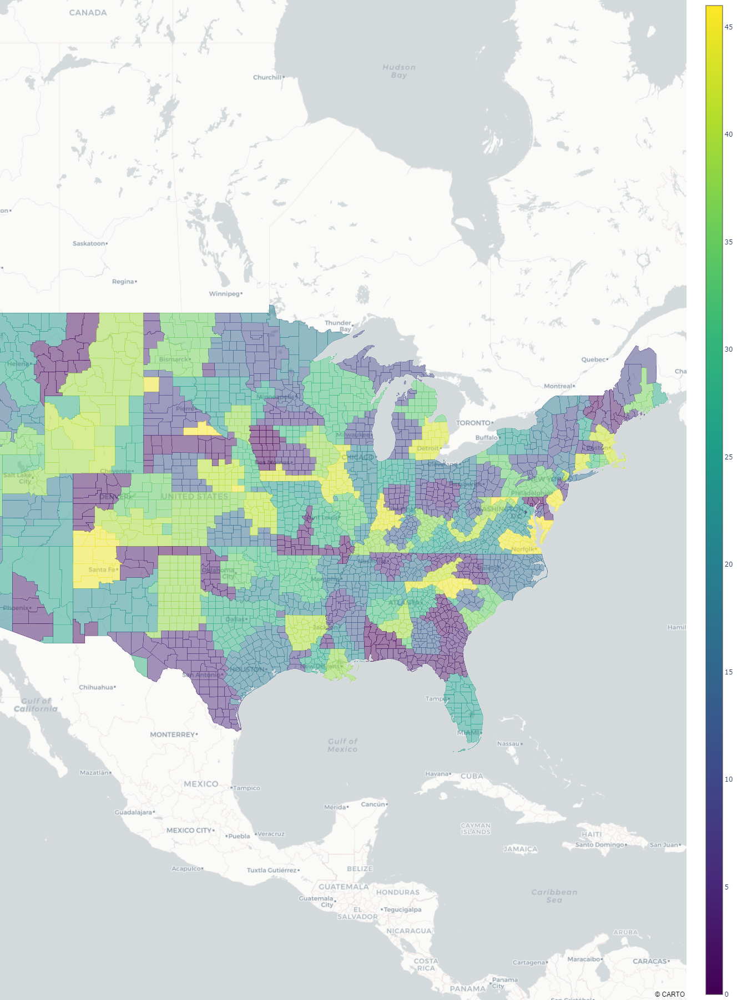

In [212]:
with open('geojson/geojson-counties-fips.json') as f:
    counties = json.load(f)
fig = go.Figure(go.Choroplethmapbox(geojson=counties, locations=FIPS, z=markers,
                                    colorscale="Viridis", zauto=True, text=FIPS,
                                    hovertemplate='<b>FIPS:%{text}</b><br><b>cluster id:%{z}</b>',
                                    marker_opacity=0.5, marker_line_width=0))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [206]:
adjacency_list['50013']

['50007', '50011']

In [2]:
clusters = loader.load_from_otherdata('clusters.dat')

In [3]:
clusters[8]

[71, 73]

In [4]:
cluster_id = loader.load_from_otherdata('cluster_id.dat')
cluster_id

{'01097': 48,
 '01003': 1,
 '01129': 64,
 '01053': 26,
 '01025': 12,
 '01099': 49,
 '01023': 11,
 '01035': 17,
 '01039': 19,
 '01091': 45,
 '01131': 65,
 '01013': 6,
 '01119': 59,
 '01041': 20,
 '01031': 15,
 '01061': 30,
 '01073': 36,
 '01117': 58,
 '01125': 62,
 '01007': 3,
 '01009': 4,
 '01115': 57,
 '01127': 63,
 '01121': 60,
 '01021': 10,
 '01037': 18,
 '01063': 31,
 '01107': 53,
 '01065': 32,
 '01057': 28,
 '01105': 52,
 '01055': 27,
 '01123': 61,
 '01081': 40,
 '01017': 8,
 '01051': 25,
 '01111': 55,
 '01027': 13,
 '01087': 43,
 '01113': 56,
 '01101': 50,
 '01001': 0,
 '01029': 14,
 '01011': 5,
 '01005': 2,
 '01085': 42,
 '01109': 54,
 '01047': 23,
 '01093': 46,
 '01059': 29,
 '01075': 37,
 '01133': 66,
 '01033': 16,
 '01079': 39,
 '01043': 21,
 '01077': 38,
 '01103': 51,
 '01083': 41,
 '01095': 47,
 '01089': 44,
 '01049': 24,
 '01071': 35,
 '01019': 9,
 '01015': 7,
 '01069': 34,
 '01067': 33,
 '01045': 22,
 '02020': 69,
 '02122': 78,
 '02170': 82,
 '02261': 91,
 '02050': 70,
 '